In [4]:
# Import necessary libraries
import snscrape.modules.twitter as sntwitter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re  
import spacy
from spacy import displacy
from collections import Counter
import en_core_web_sm
nlp = en_core_web_sm.load()

/opt/miniconda3/envs/david_data/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/miniconda3/envs/david_data/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/miniconda3/envs/david_data/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/miniconda3/envs/david_data/lib/python3.7/site-pack

In [36]:
# Setting variables to be used below
maxTweets = 500000

# Creating list to append tweet data to
tweets_list = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('horribleBosses since:2022-03-21 until:2022-03-30').get_items()):
    if i>maxTweets:
        break
    tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.username])

"# Setting variables to be used below\nmaxTweets = 500000\n\n# Creating list to append tweet data to\ntweets_list = []\n\n# Using TwitterSearchScraper to scrape data and append tweets to list\nfor i,tweet in enumerate(sntwitter.TwitterSearchScraper('horribleBosses since:2022-03-21 until:2022-03-30').get_items()):\n    if i>maxTweets:\n        break\n    tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.username])"

In [37]:
#Creating a dataframe from the tweets list above


df = pd.DataFrame(tweets_list, columns=['datetime', 'tweet_Id', 'text', 'Username'])

# Display first 5 entries from dataframe
df.head()

In [38]:
# write the dataframe into a csv 
df.to_csv('tweets.csv')

In [7]:
# read data into a dataframe
data =pd.read_csv('tweets.csv')

In [8]:
data.shape

(14136, 5)

In [9]:
#view the first few lines of the dataframe
data.head()

,Unnamed: 0,datetime,tweet_Id,text,Username
0,0,2022-03-29 23:40:05+00:00,1508952164353589249,My bosses idea of pep talk is by degrading cer...,Pottsy58
1,1,2022-03-29 23:39:49+00:00,1508952095692632064,@DrewNyingi Dem suppose drag am during that #h...,the_momentumm
2,2,2022-03-29 23:12:36+00:00,1508945248273137668,Addressing Nigerian Twitter's #HorribleBosses ...,BrandVideoPro
3,3,2022-03-29 21:14:01+00:00,1508915406920110087,📌\nI'll go out on a limb to say we can trace e...,theTosin_A
4,4,2022-03-29 19:32:01+00:00,1508889734311030784,@ademichael2000 I know it is. It's the abuse I...,shaiontheprowl


In [10]:
#view first 9 rows of data
data.text[0:9]

0    My bosses idea of pep talk is by degrading cer...
1    @DrewNyingi Dem suppose drag am during that #h...
2    Addressing Nigerian Twitter's #HorribleBosses ...
3    📌\nI'll go out on a limb to say we can trace e...
4    @ademichael2000 I know it is. It's the abuse I...
5    @KibaInuWorld Can u cooperate #kiba user in #H...
6    Everyone seems to know what employers should d...
7    Even if we stand our ground and elect a youth....
8    Tomorrow, our champions will be discussing the...
Name: text, dtype: object

In [11]:
#convert the datetime to date
data.datetime= pd.to_datetime(data.datetime).dt.date

In [12]:
# view the data frame again
data.head()

,Unnamed: 0,datetime,tweet_Id,text,Username
0,0,2022-03-29,1508952164353589249,My bosses idea of pep talk is by degrading cer...,Pottsy58
1,1,2022-03-29,1508952095692632064,@DrewNyingi Dem suppose drag am during that #h...,the_momentumm
2,2,2022-03-29,1508945248273137668,Addressing Nigerian Twitter's #HorribleBosses ...,BrandVideoPro
3,3,2022-03-29,1508915406920110087,📌\nI'll go out on a limb to say we can trace e...,theTosin_A
4,4,2022-03-29,1508889734311030784,@ademichael2000 I know it is. It's the abuse I...,shaiontheprowl


In [13]:
#group counts of tweets by date
dt=data.groupby('datetime').size()
dt

datetime
2022-03-21    6554
2022-03-22    5727
2022-03-23    1423
2022-03-24     254
2022-03-25      85
2022-03-26      38
2022-03-27      26
2022-03-28      13
2022-03-29      16
dtype: int64

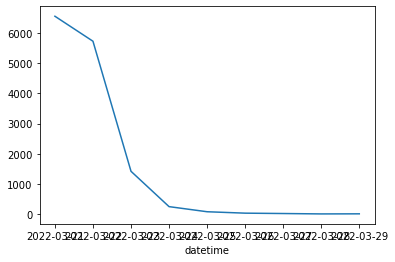

In [14]:
#plot linechat of tweets by day
sns.lineplot(err_style="bars",
			data = dt);


In [15]:
#clean the tweets and add a new column of the clean data
def cleaner(tweet):
    tweet = re.sub("@[A-Za-z0-9]+","",tweet) #Remove @ sign
    tweet = re.sub(r"(?:\@|http?\://|https?\://|www)\S+", "", tweet) #Remove http links
    tweet = " ".join(tweet.split())
    #tweet = ''.join(c for c in tweet if c not in emoji.UNICODE_EMOJI['en']) #Remove Emojis
    tweet = tweet.replace("#", "").replace("_", " ") #Remove hashtag sign but keep the text
    return tweet
data['clean'] = data['text'].map(lambda x: cleaner(x))

In [16]:
#view the new data frame
data.head()

,Unnamed: 0,datetime,tweet_Id,text,Username,clean
0,0,2022-03-29,1508952164353589249,My bosses idea of pep talk is by degrading cer...,Pottsy58,My bosses idea of pep talk is by degrading cer...
1,1,2022-03-29,1508952095692632064,@DrewNyingi Dem suppose drag am during that #h...,the_momentumm,Dem suppose drag am during that horriblebosses...
2,2,2022-03-29,1508945248273137668,Addressing Nigerian Twitter's #HorribleBosses ...,BrandVideoPro,Addressing Nigerian Twitter's HorribleBosses T...
3,3,2022-03-29,1508915406920110087,📌\nI'll go out on a limb to say we can trace e...,theTosin_A,📌 I'll go out on a limb to say we can trace ev...
4,4,2022-03-29,1508889734311030784,@ademichael2000 I know it is. It's the abuse I...,shaiontheprowl,I know it is. It's the abuse I don't agree wit...


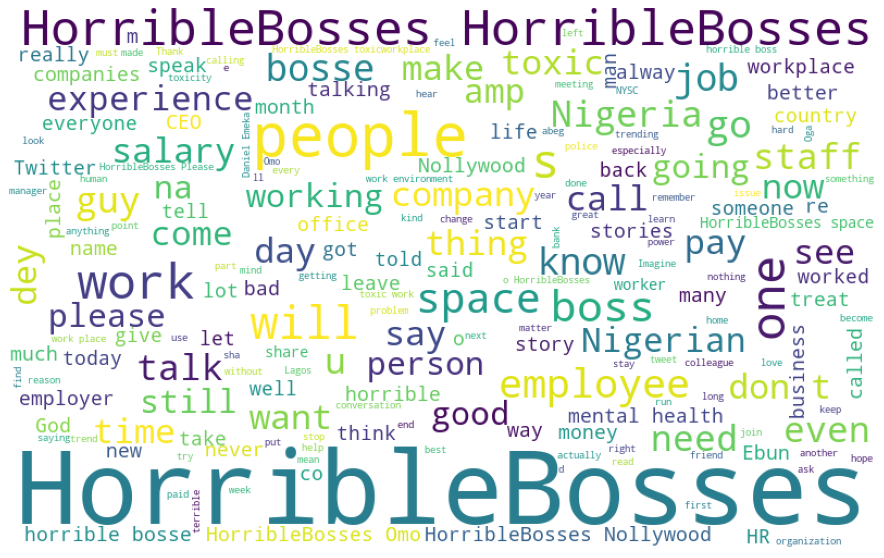

In [17]:
#create a wordcloud to view the most used words in the clean tweets

all_words = ' '.join([text for text in data['clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(background_color = 'white', width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [19]:
# extract tokens using spacy library
tokenizer = nlp.tokenizer
tokens = tokenizer(''.join(str(data.clean.tolist())))


In [20]:
#show tokens and entity 
doc = nlp(tokens)


for ent in doc.ents:
    print(ent.text,  ent.label_)


Dem NORP
😂 PERSON
Addressing Nigerian Twitter's WORK_OF_ART
HorribleBosses Trend WATCH NOW: nigeria ORG
nigerian nigeria ORG
one CARDINAL
Nigerians NORP
last week DATE
It\ ORG
bad days DATE
Jus\ ORG
We\'ll PERSON
kiba ORG
Hotbit ORG
30 days DATE
this week DATE
salaryweek getcapsa' PERSON
Tomorrow DATE
HorribleBosses ORG
MentalHealth ORG
tomorrow DATE
Facebook PRODUCT
✨🧡' ORG
Buhari GPE
1pm TIME
today DATE
the quarter DATE
Africa LOC
Africans NORP
Modern-Day Slaves EVENT
Africans NORP
the month DATE
Ayam PERSON
10 CARDINAL
Wednesday afternoons TIME
2 CARDINAL
Three CARDINAL
Trap \U0001faa4 FAC
yxnnachan GPE
Original Tweet WORK_OF_ART
three CARDINAL
3 CARDINAL
next day DATE
Dare To Live WORK_OF_ART
Himanshu Bhatia PERSON
this morning TIME
all day last week DATE
UK GPE
Last week DATE
Monday DATE
Y'all WORK_OF_ART
Chris Rock PERSON
Jada PERSON
Will Smith's PERSON
HorribleBosses ORG
new week DATE
♥ NORP
️ PERSON
HorribleBosses ORG
Jollof Derby PERSON
Wike Feminist' PERSON
Ron PERSON
Yulupa 

In [24]:
#count the tokens for most occuring words
items = [x.text for x in tokens.ents]
Counter(items).most_common(20)

[('HorribleBosses', 7634),
 ('Nigeria', 438),
 ('😂', 436),
 ('🤣', 433),
 ('one', 286),
 ('Nigerian', 286),
 ('today', 225),
 ('Nigerians', 176),
 ('Twitter', 135),
 ('first', 131),
 ("HorribleBosses Nollywood'", 126),
 ('Nollywood', 101),
 ('tomorrow', 99),
 ('Lagos', 94),
 ('2', 93),
 ('One', 89),
 ('🤦', 85),
 ('Oga', 83),
 ('morning', 79),
 ('yesterday', 67)]

In [25]:
# find nationalites and religious
norp_list = []
for ent in tokens.ents:
    if ent.label_ == 'NORP':
        norp_list.append(ent.text)
        
norp_counts = Counter(norp_list).most_common(20)
df_norp = pd.DataFrame(norp_counts, columns =['text', 'count'])

/opt/miniconda3/envs/david_data/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 127939 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/miniconda3/envs/david_data/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 127939 missing from current font.
  font.set_text(s, 0, flags=flags)


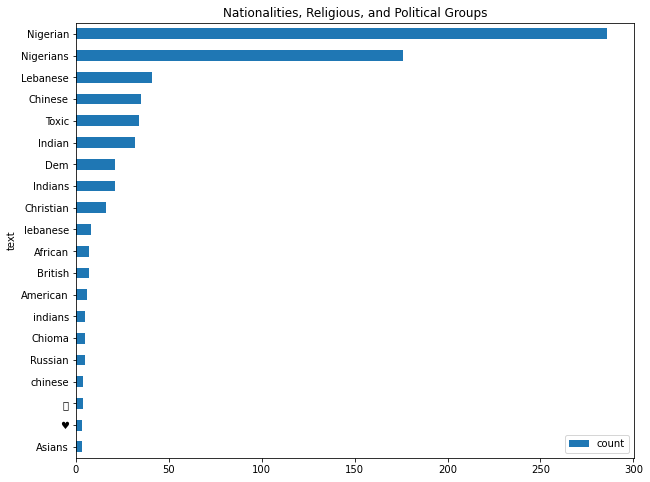

In [26]:
#plot 
df_norp.plot.barh(x='text', y='count', title="Nationalities, Religious, and Political Groups", figsize=(10,8)).invert_yaxis()

In [ ]:
import spacy
from spacy import displacy

#text = "When Sebastian Thrun started working on self-driving cars at Google in 2007, few people outside of the company took him seriously."

nlp = spacy.load("en_core_web_sm")
doc = nlp(tokens)
displacy.serve(doc, style="ent")

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-1-69063a49da65>, line 8)

In [28]:
#view names of people
person_list = []
for ent in tokens.ents:
    if ent.label_ == 'PERSON':
        person_list.append(ent.text)
        
person_counts = Counter(person_list).most_common(20)
df_person = pd.DataFrame(person_counts, columns =['text', 'count'])

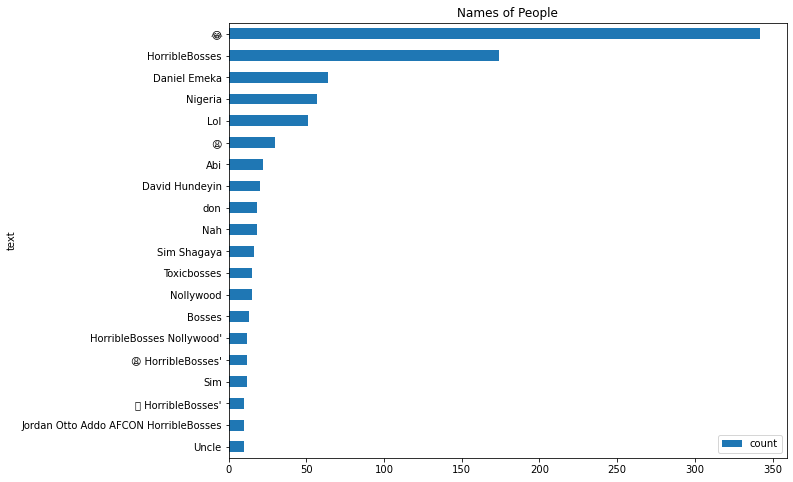

In [30]:
#plot 
df_person.plot.barh(x='text', y='count', title="Names of People", figsize=(10,8)).invert_yaxis()

In [41]:
gpe_list = []
for ent in tokens.ents:
    if ent.label_ == 'ORG':
        gpe_list.append(ent.text)
        
gpe_counts = Counter(gpe_list).most_common(20)
df_gpe = pd.DataFrame(gpe_counts, columns =['text', 'count'])
df_gpe

,text,count
0,HorribleBosses,7423
1,🤣,215
2,🤦,85
3,HorribleBosses Nollywood',69
4,HorribleEmployees,61
5,NYSC,52
6,🙏,47
7,😂,40
8,Horriblebosses,40
9,WhatsApp,29


In [43]:
#using spacy displacy function to view entities
doc = nlp(tokens)
displacy.serve(doc, style="ent")


Using the 'ent' visualizer
Serving on http://0.0.0.0:5000 ...



127.0.0.1 - - [18/Apr/2022 11:30:33] "GET / HTTP/1.1" 200 8229746
127.0.0.1 - - [18/Apr/2022 11:30:38] "GET /favicon.ico HTTP/1.1" 200 8229746


Shutting down server on port 5000.
